# Localization - Line Map - SMC Move

In [1]:
display(HTML("<style>.rendered_html.text_cell_render {max-width:700px; }</style>"));

HTML{String}("<style>.rendered_html.text_cell_render {max-width:700px; }</style>")

In [2]:
#nbx
push!(LOAD_PATH, "src");
using BenchmarkTools;
using Colors, Plots;
col = palette(:default);
(cgrad::PlotUtils.ContinuousColorGradient)(xs::Vector{Vector{Float64}}) = [cgrad[x] for x in xs];
(cgrad::PlotUtils.ContinuousColorGradient)(m::Matrix{Float64}) = reshape(cgrad[m[:]], size(m));
using Gen
using GridSlam
using Geometry
using MyUtils

Base.Vector(p::Pose) = [p.x;p.hd]

In [3]:
include("src/unpack_data.jl");

Loading `data/data_3.jld2` ...

	_segs 	Vector{Segment}
	_xs 	Vector{Vector{Float64}}
	_hds 	Vector{Float64}
	_ps 	Vector{Pose}
	_dxs 	Vector{Vector{Float64}}
	_dhds 	Vector{Float64}
	_us 	Vector{Tuple{Vector{Float64}, Float64}}
	_as 	Vector{Float64}
	_zs 	Vector{Any}
	_ss 	Vector{Vector{Measurement}}
	_fov 	Float64
	_zmax 	Int64
	_T 	Int64

To take a look call `glimpse_at_data(_segs, _ps, _ss)`


In [4]:
_fov/2π*360, length(_as), _zmax, _as[1] != _as[end], _zs[1] != _zs[end]

(360.0, 360, 20, true, true)

## Utils

In [5]:
yxlims(x::Vector{Float64},w::Number) = Dict(
    :xlim=>(x[1]-w, x[1]+w), 
    :ylim=>(x[2]-w, x[2]+w)
);

## Distributions we need

In [6]:
#nbx
push!(LOAD_PATH, ENV["probcomp"]*"/Gen-Distribution-Zoo/src")
using GenDistributionZoo: ProductDistribution, diagnormal

mvuniform = ProductDistribution(uniform);
mvuniform(zeros(5), ones(5))

5-element Vector{Float64}:
 0.7328791948707849
 0.20143409061612272
 0.20338225121501952
 0.7824859699062376
 0.8811727556112978

In [7]:
#nbx

# We use `anywhere` to model a sensor failure, in which case
# we want to ignore its measurement. This is a bit of a hack, 
# but works
struct Anywhere <: Distribution{Vector{Float64}} end
const anywhere = Anywhere()

Gen.logpdf(::Anywhere, x::Vector{Float64}) = 0.0
Gen.random(::Anywhere) = [Inf;Inf]
(::Anywhere)() = Gen.random(Anywhere())
Gen.has_output_grad(::Anywhere)    = false
Gen.has_argument_grads(::Anywhere) = ();

In [8]:
logpdf(anywhere, [Inf;Inf]),
logpdf(anywhere, rand(2))

(0.0, 0.0)

## Pose prior

In [9]:
#nbx --fname="src/pose_prior_model.jl"
_bb = bounding_box(_segs);

@doc """
    p = pose_prior_model(p=nothing, x_noise=0.25, hd_noise=22.5)

Model depends on global variable `_segs`.
"""
@gen function pose_prior_model(p=nothing, x_noise=0.25, hd_noise=22.5, bb=_bb)
    if p == nothing
        x  ~ mvuniform([bb[1]...],[bb[2]...])
        hd ~ uniform(0,2π)
    else
        x  ~ diagnormal(p.x, [x_noise,x_noise])
        hd ~ normal(p.hd, hd_noise/360*π)
    end
    return Pose(x,hd)
end;

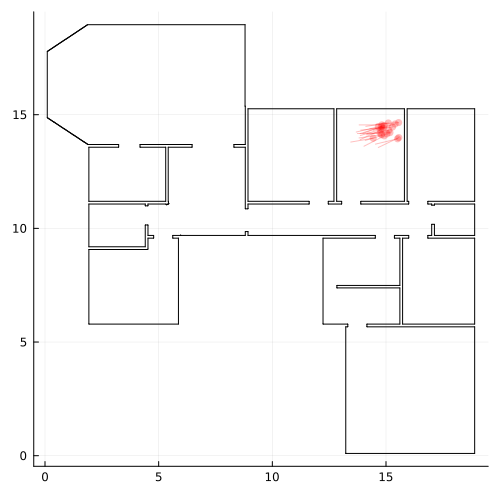

In [10]:
ps = [pose_prior_model(_ps[1]) for t=1:20]
# -----------------
myplot = plot(size=(500,500), aspect_ratio=:equal, legend=nothing)
plot!(_segs, c=:black)
scatter!.(ps, alpha=0.25)
myplot

## Motion model

In [13]:
#nbx --fname="src/motion_model.jl"
"""
    p′ = motion_model(p, u, x_noise=0.25, hd_noise=22.5)

Sample a new pose `p′` given the previous pose `p`, 
some control data `u = (dx, dhd)`, and noise levels
`x_noise` and `hd_noise` (in degrees).
"""
@gen function motion_model(p, u, x_noise=0.25, hd_noise=22.5)
    dx, dhd = u
    x   ~ diagnormal(p.x  + dx , [x_noise, x_noise])
    hd  ~ normal(p.hd + dhd, hd_noise/360*π)
    return p = Pose(x, hd)
end;

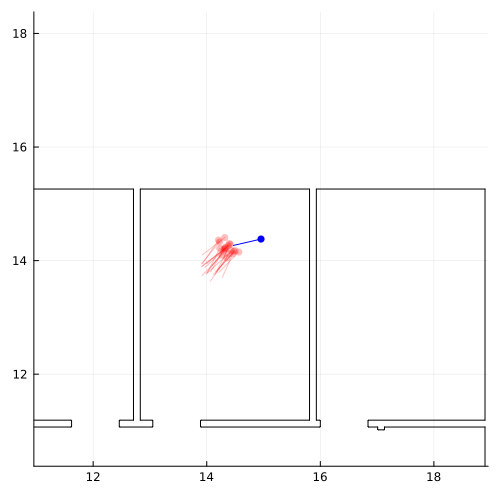

In [14]:
x_noise  = 0.1
hd_noise = 22.5;
t = 1
p = _ps[t]

ps = [motion_model(p, _us[1], x_noise, hd_noise) for t=1:20]
# -----------------
myplot = plot(size=(500,500), 
    xlim=(p.x[1]-4, p.x[1]+4), 
    ylim=(p.x[2]-4, p.x[2]+4),
    aspect_ratio=:equal, legend=nothing)
plot!(_segs, c=:black)
scatter!(p, r=0.5, c=:blue)
scatter!.(ps, r=0.5, alpha=0.25)
myplot

## Sensor model 

The sensor model is the only part that depends on the map.
Since in this notebook we are only concerned with localization, not mapping,
we assume we are given a map of the environment. In this notebook the map is a
bunch of line segments stored in `_segs`.

### GPU Accelerated Sensor - GM or anywhere

In [32]:
using CUDA

In [33]:
function logsumexp(x, dim)
    c = maximum(x)
    return c .+ log.(sum(exp.(x .- c), dims=dim))
end

logsumexp (generic function with 1 method)

#### slw_cu

In [44]:
function sliding_window_cuda(x, w::Int, y)
    @assert size(y,1) == size(x,1)
    @assert size(y,2) == 2*w+1
    
    ix = (blockIdx().x - 1) * blockDim().x + threadIdx().x
    iy = (blockIdx().y - 1) * blockDim().y + threadIdx().y
    sx = gridDim().x * blockDim().x
    sy = gridDim().y * blockDim().y
        
    for i = ix:sx:size(x,1), j = iy:sy:2*w+1
        offset = j-1-w
        k = mod(i + offset -1 , size(x,1)) + 1
        @inbounds y[i,j] = x[k]
    end
    return
end

function slw_cu!(x::CuArray, w::Int; blockdims=(32,8))
    n = size(x,1)
    m = 2*w+1
    
    y = CUDA.ones(n,m)
    griddims = cuda_grid((n,m), blockdims)
    CUDA.@sync begin
        @cuda threads=blockdims blocks=griddims sliding_window_cuda(x, w, y)
    end
    
    return y
end

slw_cu! (generic function with 1 method)

In [45]:
x_ = CuArray(collect(1:5))
w  = 1
y_ = slw_cu!(x_, w; blockdims=(32,8))

5×3 CuArray{Float32, 2, CUDA.Mem.DeviceBuffer}:
 5.0  1.0  2.0
 1.0  2.0  3.0
 2.0  3.0  4.0
 3.0  4.0  5.0
 4.0  5.0  1.0

#### cast_cu

In [502]:
include("src/cuda_raycaster_line_map.jl");
segs_ = CuArray(stack(Vector.(_segs)))

# Todo: Change cast_v4! signature and put z_ in there 
#       and replace arg by num_a and fov....
function cast_cu(ps_::CuArray; blockdims=(16,16))
    n = size(segs_, 1)    
    m = size(ps_,1)
    z_ = Inf*CUDA.ones(m, n, 360)
    z_ = cast_v4!(segs_,ps_,z_; blockdims=blockdims)
    
    return z_
end

cast_cu (generic function with 1 method)

In [47]:
ps = [p]
ps_ = CuArray(stack(Vector.(ps)))
zs_ = cast_cu(ps_; blockdims=(16,16))

1×360 CuArray{Float64, 2, CUDA.Mem.DeviceBuffer}:
 0.876518  0.880197  0.884178  0.888466  …  0.867232  0.870041  0.873134

In [48]:
polar_inv_cu(z::CuArray,a::CuArray) = cat(z.*cos.(a), z.*sin.(a), dims=ndims(a)+1)

polar_inv_cu (generic function with 1 method)

#### y_tilde_cu

In [51]:
a_ = CuArray(_as)
function get_y_tilde_cu(z_::CuArray, w::Int)    
    z_tilde_ = slw_cu!(z_, w)
    a_tilde_ = slw_cu!(a_, w)
    
    y_tilde_ = polar_inv_cu(z_tilde_, a_tilde_)
    
    return y_tilde_
end

get_y_tilde_cu (generic function with 1 method)

In [192]:
w = 100
zs_ = cast_cu(ps_; blockdims=(16,16))
z_ = zs_[1,:]
y_tilde_ = get_y_tilde_cu(z_, w);
y_tilde = Array(y_tilde_);
size(y_tilde)

(360, 201, 2)

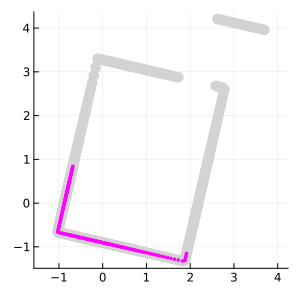

In [202]:
i = 50
# ------
myplot = plot(size=(300,300), aspect_ratio=:equal, legend=nothing)
# plot!(_segs, c=:black)
scatter!(y_tilde[:,1,1],y_tilde[:,1,2], markersize=6, markerstrokewidth=0, c=:lightgray)
scatter!(y_tilde[i,:,1],y_tilde[i,:,2], markersize=2, markerstrokewidth=0, c=:magenta)

# scatter!(p, r=0.5)

#### gaussian_logpdf

In [ ]:
function gaussian_logpdf(x, mu, sig)
    d = (x .- mu).^2 ./ sig.^2
    log_p = - log.(sqrt.(sig * 2 * π)) .- 1/2 * d
    return log_p
end;

#### sensor_logpdf_cu

In [63]:
function sensor_logpdf_cu(x::CuArray, y_tilde::CuArray, sig, dropout)
    n = size(y_tilde,1)
    m = size(y_tilde,2)
    
    @assert size(x,1) == size(y_tilde,1)
    
    x = reshape(x, n, 1, 2)
    
    # Compute 1D Gaussians - (n,m,2)
    # Convert to 2D gausians - (n,m)
    # Convert to mixture of m 2D gausians (GM) - (n,)
    # Convert to mixture of `GM` and `anywhere` (D) - (n,)
    # Convert to Product of D's - ()
    log_p = gaussian_logpdf(x, y_tilde, sig)
    log_p = sum(log_p, dims=3)[:,:,1] 
    log_p = logsumexp(log_p .- log(m), 2)[:,1] 
    log_p_or_any = log.((1-dropout)*exp.(log_p) .+ dropout*1.0)
    log_p = sum(log_p_or_any)
    return log_p
end

sig=1.0
dropout=0.1
x = stack(polar_inv(_zs[1],_as))
x_ = CuArray(x)
@btime sensor_logpdf_cu($x_, $y_tilde_, sig, dropout) samples=3 evals=3;

  358.325 μs (596 allocations: 33.33 KiB)


In [64]:
#nbx
struct SensorDistribution_CUDA <: Distribution{Vector{Vector{Float64}}} 
end

const sensordist_cu = SensorDistribution_CUDA()

function Gen.logpdf(::SensorDistribution_CUDA, x, y_tilde_::CuArray, sig, dropout)
    x_ = CuArray(stack(x))
    return sensor_logpdf_cu(x_, y_tilde_, sig, dropout)
end
function Gen.random(::SensorDistribution_CUDA, y_tilde_::CuArray, sig, dropout)
    n = size(y_tilde_,1)
    m = size(y_tilde_,2)

    x = Vector{Float64}[]
    for i=1:n
        if bernoulli(dropout)
            x_i = [Inf;Inf]
        else
            j = rand(1:m)
            y = Array(y_tilde_[i,j,:])
            x_i = diagnormal(y, [sig;sig])

        end
        push!(x, x_i)
    end
    return x
end

(D::SensorDistribution_CUDA)(args...) = Gen.random(D, args...)
Gen.has_output_grad(::SensorDistribution_CUDA)    = false
Gen.has_argument_grads(::SensorDistribution_CUDA) = (false, false);

In [65]:
dropout=1.0
x = sensordist_cu(y_tilde_, sig, dropout);

In [66]:
p_ = CuArray(stack([Vector(p)]))
z_ = cast_cu(p_; blockdims=(16,16))

w = 360
y_tilde_ = get_y_tilde_cu(z_[1,:], w);

dropout=0.1
x = sensordist_cu(y_tilde_, sig, dropout);
println("|dropouts| = $(sum(x .== [[Inf;Inf]]))")
logpdf(sensordist_cu, x, y_tilde_, sig, dropout);

|dropouts| = 35


### Sensor Model

In [485]:
"""
    x, x′ = sensor_model_GPU(p, w, std, dropout)
"""
@gen function sensor_model_GPU(p, w, std, dropout)
    
    ps_ = CuArray(stack([Vector(p)]))
    zs_ = cast_cu(ps_; blockdims=(16,16))
    z_ = zs_[1,:]
    
    x′ = polar_inv(Array(z_), _as)
    
    y_tilde_ = get_y_tilde_cu(z_, w);
        
    x ~ sensordist_cu(y_tilde_, std, dropout);

    return x,x′
end;

|dropouts| = 43


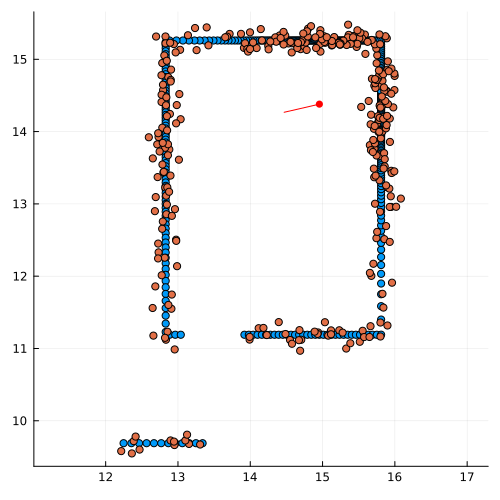

In [487]:
t = 1
p = _ps[t]
w = 1
sig = 0.1
dropout = 0.1
args = (p, w, sig, dropout)
sensor_model_GPU(args...);

# ch = choicemap(:x => polar_inv(_zs[t],_as))
ch = choicemap()

tr,w = generate(sensor_model_GPU, args, ch);

x, x′ = get_retval(tr);
p, = get_args(tr)

println("|dropouts| = $(sum(x .== [[Inf;Inf]]))")

# ------
myplot = plot(size=(500,500), aspect_ratio=:equal, legend=nothing)
scatter!(x′.*p)
scatter!(x.*p)
scatter!(p, r=0.5)

## SMC - Move

In [652]:
8^3

512

In [653]:
function slw_cudakernel(x, w::Int, y)
    
    m = 2*w + 1
    
    @assert ndims(y) == 3
    @assert ndims(x) == ndims(y) - 1
    @assert size(x,1) == size(y,1)
    @assert size(x,2) == size(y,2)
    @assert size(y,3) == m
    
    ix = (blockIdx().x - 1) * blockDim().x + threadIdx().x
    iy = (blockIdx().y - 1) * blockDim().y + threadIdx().y
    iz = (blockIdx().z - 1) * blockDim().z + threadIdx().z
    sx = gridDim().x * blockDim().x
    sy = gridDim().y * blockDim().y
    sz = gridDim().z * blockDim().z
        
    for j_pose = ix:sx:size(y,1), j_obs = iy:sy:size(y,2), j_mix = iz:sz:size(y,3)
        offset = j_mix-1-w
        j_mix = mod(j_obs + offset - 1 , size(x,2)) + 1
        @inbounds y[j_pose, j_obs, j_mix] = x[j_pose, j_mix]
    end
    return
end

function slw_cuda!(x::CuArray, w::Int; blockdims=(8,8,4))
    
    k = size(x,1)
    n = size(x,2)
    m = 2*w+1
    
    y = CUDA.ones(k,n,m)
    griddims = cuda_grid((k,n,m), blockdims)
    CUDA.@sync begin
        @cuda threads=blockdims blocks=griddims slw_cudakernel(x, w, y)
    end
    
    return y
end

slw_cuda! (generic function with 1 method)

In [654]:
function sensor_logpdf_cu_v2(x::CuArray, y_tilde::CuArray, sig, dropout)
    
    n = size(y_tilde,1)
    m = size(y_tilde,2)
    
    @assert size(x,1) == size(y_tilde,1)
    
    x = reshape(x, n, 1, 2)
    
    # Compute 1D Gaussians - (n,m,2)
    # Convert to 2D gausians - (n,m)
    # Convert to mixture of m 2D gausians (GM) - (n,)
    # Convert to mixture of `GM` and `anywhere` (D) - (n,)
    # Convert to Product of D's - ()
    log_p = gaussian_logpdf(x, y_tilde, sig)
    log_p = sum(log_p, dims=3)[:,:,1] 
    log_p = logsumexp(log_p .- log(m), 2)[:,1] 
    log_p_or_any = log.((1-dropout)*exp.(log_p) .+ dropout*1.0)
    log_p = sum(log_p_or_any)
    return log_p
end

sig=1.0
dropout=0.1
x = stack(polar_inv(_zs[1],_as))
x_ = CuArray(x)
@btime sensor_logpdf_cu($x_, $y_tilde_, sig, dropout) samples=3 evals=3;

LoadError: CUDA error: an illegal memory access was encountered (code 700, ERROR_ILLEGAL_ADDRESS)

In [632]:
function pose_grid(p,k,delta_x,delta_hd)

    dx1_ = CUDA.collect(CUDA.range(-delta_x,  delta_x, k))
    dx2_ = CUDA.collect(CUDA.range(-delta_x,  delta_x, k))
    dhd_ = CUDA.collect(CUDA.range(-delta_hd, delta_hd,k))
    dx1_ = CuArray(dx1_)
    dx2_ = CuArray(dx2_)
    dhd_ = CuArray(dhd_)
    dx1_ = CUDA.repeat(dx1_,  1, k, k)
    dx2_ = CUDA.repeat(reshape(dx2_,1,k,1), k, 1, k)
    dhd_ = CUDA.repeat(reshape(dhd_,1,1,k), k, k, 1)

    p_ = CUDA.cat(dx1_,dx2_, dhd_, dims=4)
    p_ = reshape(p_, :,3)
    p_ = p_ .+ reshape(CuArray(Vector(p)),1,3)
    return p_
end

p = _ps[1]
delta_x  = 0.5
delta_hd = 10
k = 10
@btime pose_grid($p,$k,$delta_x,$delta_hd) samples=3 evals=3;

  155.993 μs (396 allocations: 20.44 KiB)


In [657]:
using CUDA
CUDA.ones(3,4)

LoadError: CUDA error: an illegal memory access was encountered (code 700, ERROR_ILLEGAL_ADDRESS)

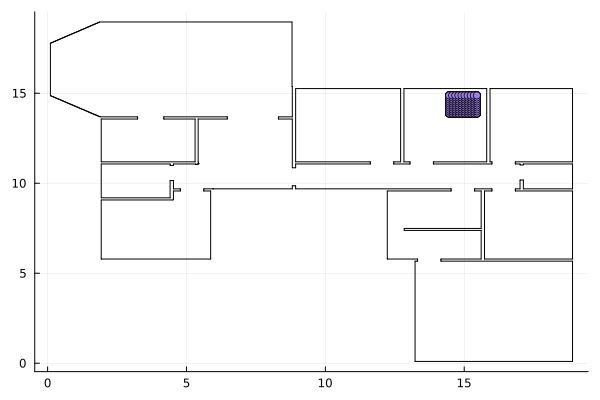

In [633]:
ps_ = pose_grid(p,k,delta_x,delta_hd)

plot(legend=nothing)
plot!(_segs, c=:black)
scatter!(Array(ps_)[:,1],Array(ps_)[:,2])

In [634]:
p = _ps[1]

k = 10
delta_x  = 0.1
delta_hd = 20/360*π

ps_ = pose_grid(p,k,delta_x,delta_hd)
zs_ = cast_cu(ps_; blockdims=(16,16))

@btime cast_cu($ps_; blockdims=(4,64)) samples=1 evals=1;

  4.284 ms (218 allocations: 11.30 KiB)


In [645]:
ps = [Pose(p[1:2],p[3]) for p in eachrow(Array(ps_))];
xs = [polar_inv(Array(z),_as) for z in eachrow(Array(zs_))];


mypl = plot(legend=nothing)
plot!(_segs, c=:black)
scatter!(Array(ps_)[:,1],Array(ps_)[:,2])
for (p,x) in zip(ps[1:100],xs[1:100])
    scatter!(x.*p, markersize=1)
end
mypl

In [651]:
slw_cuda!(zs_, 7)

LoadError: CUDA error: an illegal memory access was encountered (code 700, ERROR_ILLEGAL_ADDRESS)

In [650]:
a_ = CuArray(_as)
# as_ = CUDA.repeat(a_,length(zs_),length(a_))

zs_tilde_ = slw_cuda!(zs_, 7)
# a_tilde_ = slw_cu!(a_, 7)

LoadError: CUDA error: an illegal memory access was encountered (code 700, ERROR_ILLEGAL_ADDRESS)

In [ ]:
# a_ = CuArray(_as)
# function get_y_tilde_cu(z_::CuArray, w::Int)    
#     z_tilde_ = slw_cu!(z_, w)
#     a_tilde_ = slw_cu!(a_, w)
    
#     y_tilde_ = polar_inv_cu(z_tilde_, a_tilde_)
    
#     return y_tilde_
# end

In [623]:
function pose_proposal(p, w::Int, r::Int, delta_x=0.2, delta_hd=10)
    delta_hd = delta_hd/360*π
    
    ps_ = pose_grid(p, r, delta_x,delta_hd)
    zs_ = cast_cu(ps_; blockdims=(16,16))
    
    k = size(zs_,1)
    n = size(zs_,2)
    m = 2*w+1
    
    y_tildes_ = CUDA.ones(k,n,m,2)
    for ik=1:k
        y_tildes_[ik,:,:,:] = get_y_tilde_cu(zs_[ik,:], w)
    end
#     get_y_tilde_cu(zs_[1,:], w)
    
end

@btime pose_proposal(p, 7, 10, delta_x, delta_hd) samples=1 evals=1;

  177.098 ms (368538 allocations: 17.15 MiB)


## SLAM Model

General structure:
```julia
motion_model(p::Pose, u::Control, motion_args...)
sensor_model(p::Pose, m::MAP, sensor_args...)
```
Here:
```julia
sensor_model(p::Pose, sensor_args...)
```

```julia

    prior     chain 
     0          1        2          t-1

               u[1] --- u[2]  ...  u[t-1]
                |        |          |
    p[1] - - - p[2] --- p[3]  ...  p[t]
     |          |        |          |
    y[1]       y[2]     y[3]  ...  y[t] 
```

In [96]:
#nbx
@gen function slam_kernel(t, state, us, x_noise, hd_noise, w, s_noise, dropout)
    
        p,_ = state
        u = us[t]
    
        p  = {:pose}   ~ motion_model(p, u, x_noise, hd_noise)
        x, = {:sensor} ~ sensor_model_GPU(p, w, s_noise, dropout) # GPU accelerated
        
    return (p, x)
end

slam_chain = Gen.Unfold(slam_kernel)
Gen.@load_generated_functions

In [97]:
#nbx
"""
    [(p,z),...] = static_slam_model(T, segs_, a_, us, motion_noise, sensor_noise, dropout, inds)

Static SLAM model ...
"""
@gen (static) function static_slam_model(T, us, 
        p0, x0_noise, hd0_noise,  
        x_noise, hd_noise, 
        w, s_noise, dropout)
    
    # Start the Markov chain; 
    # No motion, just the prior
    p  = { :pose   } ~ pose_prior_model(p0, x0_noise, hd0_noise)
    x, = { :sensor } ~ sensor_model_GPU(p, w, s_noise, dropout) # GPU accelerated
    
    # Unfold the MArkov chain
    chain ~ slam_chain(T, (p, nothing), us, 
        x_noise, hd_noise, 
        w, s_noise, dropout)
    
    return [(p,x);chain]
end

Gen.@load_generated_functions

In [98]:
foldr(=>,[:x, :y, :z]) 

:x => (:y => :z)

In [241]:
get_pose(tr,t) = tr[][t][1]
get_first_pose(tr) = get_pose(tr,1)

get_x(tr,t) = tr[][t][2]
get_first_x(tr) = get_x(tr,1)

get_first_x (generic function with 1 method)

In [100]:
function Plots.plot!(p::Pose; r=0.5, args...)
    plot!([p.x, p.x + r*unit_vec(p.hd)]; args...)
end

function Plots.plot!(ps::Vector{Pose}, cs::Vector{RGBA{Float64}}; r=0.5, args...)
    for (p,c) in zip(ps,cs)
        plot!([p.x, p.x + r*unit_vec(p.hd)];c=c, args...)
    end
end

In [105]:
function constraints(t::Int)
    ch = choicemap()
    if t==0
        addr  = :sensor => :x
    else
        addr  = :chain => t => :sensor => :x
    end
    n = length(_zs[t+1])
    x = polar_inv(_zs[t+1],_as)
    ch[addr] = x
    return ch
end

constraints (generic function with 1 method)

In [417]:
T = 0

p0 = _ps[1]
x0_noise = .5
hd0_noise = 15.

x_noise = 0.1
hd_noise = 22.5

wind = 360
s_noise = 0.5
dropout = 0.01

ch = constraints(0)

args = (
    T, _us,         
    p0, x0_noise, hd0_noise, # Pose prior model
    x_noise, hd_noise,       # Motion model
    wind, s_noise, dropout      # Sensor model
)

@time tr, w = generate(static_slam_model, args, ch);

  0.001489 seconds (1.58 k allocations: 108.906 KiB)


In [418]:
N = 1_000
@time trs, ws, lml = importance_sampling(static_slam_model, args, ch, N);

trs = trs[ws .!= -Inf]
ws  = ws[ws .!= -Inf]

scores = get_score.(trs);
perm = sortperm(ws); 
trs = trs[perm]; 
ws = ws[perm]; 
scores=scores[perm];

  1.264802 seconds (1.65 M allocations: 108.777 MiB, 12.14% gc time)


In [419]:
sum(ws .== NaN),sum(ws .== -Inf), sum(scores .== NaN), sum(scores .== -Inf)

(0, 0, 0, 0)

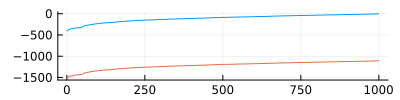

In [420]:
plot(size=(400,100), legend=nothing)
plot!(ws)
plot!(scores)

    w = 360
    s_noise = 0.5
    dropout = 0.01



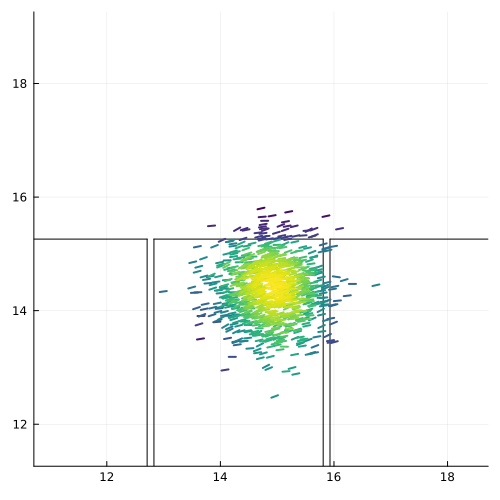

In [421]:
println("""
    w = $(wind)
    s_noise = $(s_noise)
    dropout = $(dropout)
""")
perm = sortperm(exp.(ws)); trs = trs[perm]; ws = ws[perm];
p = ps[1]
ps = get_pose.(trs, 1)
cs = peak_to_peak(ws)
# ------
myplot = plot(size=(500,500),
    xlim=(p.x[1]-4, p.x[1]+4), 
    ylim=(p.x[2]-4, p.x[2]+4),
    aspect_ratio=:equal, legend=nothing)
plot!(_segs, c=:black)
# scatter!(y.*p)
plot!(ps, cgrad(:viridis)[cs], r=0.125, linewidth=2)
myplot

In [449]:
function plot_tr(tr; size=(200,200), r=1.0)
    p = get_first_pose(tr)
    x = get_first_x(tr)
    
    println(Vector(p) - Vector(_ps[1]))
    
    myplot = plot(size=size,
    xlim=(p.x[1]-4, p.x[1]+4), 
    ylim=(p.x[2]-4, p.x[2]+4),
    aspect_ratio=:equal, legend=nothing)
    plot!(_segs, c=:black)
    scatter!(_ps[1],  r=r, c=:red)
    scatter!(p, r=r, c=col[1])
    scatter!(x.*p, c=col[1], markerstrokewidth=0, alpha=.2, markersize=2, marker=:o)
    myplot
end

plot_tr (generic function with 1 method)

[-0.021418039950658496, 0.0823731805857566, -0.04839708297671441]


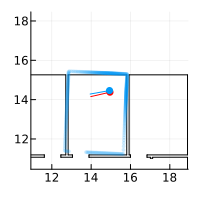

In [450]:
tr = trs[end]
plot_tr(tr; size=(200,200))

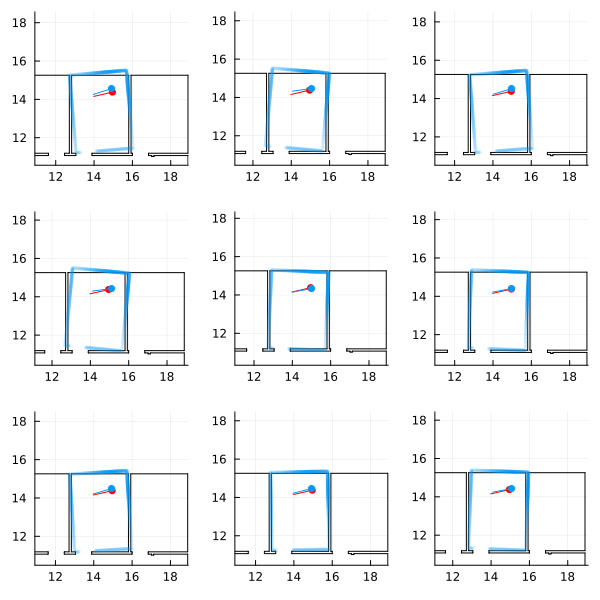

In [424]:
plot([plot_tr(tr; size=(200,200)) for tr in trs[end-9+1:end]]..., layout=(3, 3), size=(600,600))

## Particle Filter

In [425]:
include("src/gen_utils.jl")

argdiffs (generic function with 1 method)

In [474]:
p0 = _ps[1]
x0_noise = .5
hd0_noise = 15.

x_noise = 0.1
hd_noise = 22.5

wind = 50
s_noise = 0.5
dropout = 0.01

ch = constraints(0)

args = (_us,         
    p0, x0_noise, hd0_noise, # Pose prior model
    x_noise, hd_noise,       # Motion model
    wind, s_noise, dropout      # Sensor model
)
diffs = argdiffs([1; fill(0, length(args))])

N = 1_000
state = initialize_particle_filter(static_slam_model, (0, args...), ch, N);

println(minimum(state.log_weights), "  ,  " ,maximum(state.log_weights))


PS = Array{Pose,2}(undef, N, T)
WS = Array{Float64,2}(undef, N, T)
T = 10
for t=1:T
    ch = constraints(t)
    

    for i in 1:N
        PS[i,t] = state.traces[i][][end][1]
        WS[i,t] = state.log_weights[i]
    end
    
    b = maybe_resample!(state, ess_threshold=50)
#     b = maybe_resample!(state, ess_threshold=4_500)
    println(b)
    @time particle_filter_step!(state, (t, args...), diffs, ch) 
#     println(minimum(state.log_weights), "  ,  " ,maximum(state.log_weights))
#     println(minimum(get_score.(state.traces)), " ,  ", maximum(get_score.(state.traces)))
end

-1534.4881379123856  ,  -741.7543714130903
true
  0.992230 seconds (1.65 M allocations: 112.582 MiB)
true
  1.451621 seconds (1.83 M allocations: 118.102 MiB, 10.49% gc time)
true
  0.991593 seconds (1.65 M allocations: 112.658 MiB)
true
  1.005402 seconds (1.65 M allocations: 112.673 MiB)
true
  1.449856 seconds (1.83 M allocations: 118.179 MiB, 10.94% gc time)
true
  0.990738 seconds (1.65 M allocations: 112.720 MiB)
true
  1.045131 seconds (1.65 M allocations: 112.750 MiB)
true
  1.508046 seconds (1.83 M allocations: 118.240 MiB, 9.75% gc time)
true
  1.023345 seconds (1.65 M allocations: 112.796 MiB)
true
  1.048083 seconds (1.65 M allocations: 112.811 MiB)


[-0.069723914320857, 0.11625690967840718, 0.05617277504309337]


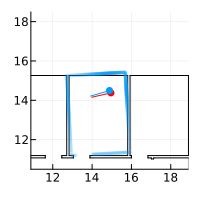

In [470]:
trs = state.traces
ws  = state.log_weights;

trs = trs[ws .!= -Inf]
ws  = ws[ws .!= -Inf]
scores = get_score.(trs)

perm = sortperm(ws); 
trs = trs[perm]; 
ws = ws[perm]; 
scores=scores[perm];

tr = trs[end]
plot_tr(tr; size=(200,200))

    w = 50
    s_noise = 0.5
    dropout = 0.01



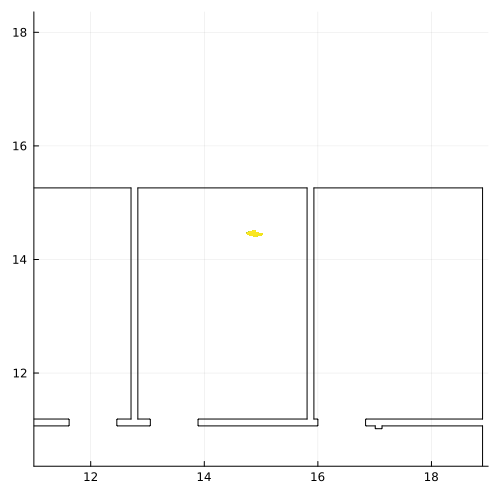

In [471]:
println("""
    w = $(wind)
    s_noise = $(s_noise)
    dropout = $(dropout)
""")
p = ps[1]
ps = get_pose.(trs, 1)
cs = peak_to_peak(ws)
# ------
myplot = plot(size=(500,500),
    xlim=(p.x[1]-4, p.x[1]+4), 
    ylim=(p.x[2]-4, p.x[2]+4),
    aspect_ratio=:equal, legend=nothing)
plot!(_segs, c=:black)
# scatter!(y.*p)
plot!(ps, cgrad(:viridis)[cs], r=0.125, linewidth=2)
myplot

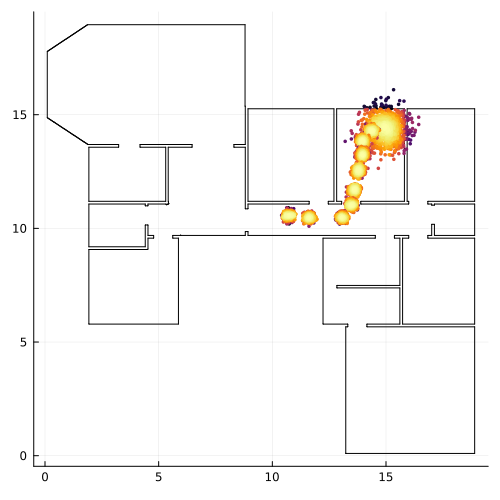

In [484]:


myplot = plot(size=(500,500),
#     xlim=(p.x[1]-4, p.x[1]+4), 
#     ylim=(p.x[2]-4, p.x[2]+4),
    aspect_ratio=:equal, legend=nothing)
plot!(_segs, c=:black)

# for i = 1:length(trs)
#     perm = sortperm(WS[i,:])
#     scatter!([p.x for p in PS[i,:]], zcolor=WS[i,:])
# end

for t = 1:T
    perm = sortperm(WS[:,t])
    scatter!([p.x for p in PS[perm,t]], zcolor=peak_to_peak(WS[perm,t]), markerstrokewidth=0, markersize=2)
end
myplot